# Experiment evaluation

In [3]:
import os, json, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns

sns.set_theme(style="whitegrid", palette="colorblind")
plt.rcParams.update({"figure.dpi": 120, "figure.facecolor": "white"})

EXPERIMENTS_DIR = "experiments3"

## 1. Load all experiment artifacts

Scansiona la cartella `experiments/` e carica tutti i JSON degli artefatti.  
Da ciascun filename estrae: **model_type**, **noise_method**, **dirty_feature**, **percentage**.  
Il risultato è un unico `DataFrame` con una riga per esperimento.

In [4]:
MODELS_DIR = "models"

def _parse_artifact(art):
    """Extract flat metric columns from a single artifact dict."""
    row = {
        'mcc_bin':  art.get('mcc_bin'),
        'mcc_mul':  art.get('mcc_mul'),
        'mean_mcc': art.get('mean_mcc'),
        'val_loss': art.get('val_loss'),
    }
    for key in ('metrics_binary', 'metrics_multiclass'):
        m_dict = art.get(key, {})
        for metric_name in ('accuracy', 'f1', 'mcc', 'auc'):
            col_name = f"{key.replace('metrics_', '')}_{metric_name}"
            row[col_name] = m_dict.get(metric_name)
    row['feature_importance'] = art.get('feature_importance', {})

    # Binary confusion matrix → TN, FP, FN, TP
    cm = art.get('cm_bin')
    if cm and len(cm) == 2 and len(cm[0]) == 2:
        row['TN'] = cm[0][0]
        row['FP'] = cm[0][1]
        row['FN'] = cm[1][0]
        row['TP'] = cm[1][1]
    else:
        row['TN'] = row['FP'] = row['FN'] = row['TP'] = np.nan

    return row


def _load_baselines(models_dir=MODELS_DIR):
    """
    Load Baseline artifacts from models/ and return a dict:
        { 'tabnet': {row_dict}, 'cnn_lstm': {row_dict} }
    """
    baselines = {}
    for prefix in ('tabnet', 'cnn_lstm'):
        fname = f'{prefix}_trial_Baseline_artifacts.json'
        fpath = os.path.join(models_dir, fname)
        if not os.path.exists(fpath):
            continue
        with open(fpath) as f:
            art = json.load(f)
        baselines[prefix] = _parse_artifact(art)
    return baselines


def load_all_experiments(experiments_dir=EXPERIMENTS_DIR, models_dir=MODELS_DIR):
    """
    Read every *_artifacts.json in `experiments_dir` and return a flat DataFrame.

    Baseline models (0% corruption) are loaded from `models_dir` and replicated
    for every (dirty_feature, noise_method) combination so they appear as the
    starting point at percentage=0 in every chart.
    """
    pattern = re.compile(
        r'^(tabnet|cnn_lstm)_trial_Experiment_'
        r'(labels|missing|outliers|noise|duplicated)_'
        r'(.+?)_'
        r'([\d.]+)_artifacts\.json$'
    )

    rows = []
    for fname in sorted(os.listdir(experiments_dir)):
        if not fname.endswith('_artifacts.json'):
            continue
        m = pattern.match(fname)
        if not m:
            continue

        model_key     = m.group(1)
        noise_method  = m.group(2)
        dirty_feature = m.group(3)
        pct           = float(m.group(4))

        with open(os.path.join(experiments_dir, fname)) as f:
            art = json.load(f)

        row = {
            'model_type':    model_key,
            'noise_method':  noise_method,
            'dirty_feature': dirty_feature,
            'percentage':    pct,
            **_parse_artifact(art),
        }
        rows.append(row)

    df = pd.DataFrame(rows)

    # ── Inject baselines as percentage = 0 ────────────────────────────
    baselines = _load_baselines(models_dir)
    if baselines:
        combos = df[['noise_method', 'dirty_feature']].drop_duplicates()
        baseline_rows = []
        for _, combo in combos.iterrows():
            for model_key, base_row in baselines.items():
                baseline_rows.append({
                    'model_type':    model_key,
                    'noise_method':  combo['noise_method'],
                    'dirty_feature': combo['dirty_feature'],
                    'percentage':    0.0,
                    **base_row,
                })
        df = pd.concat([pd.DataFrame(baseline_rows), df], ignore_index=True)
        print(f"Injected {len(baseline_rows)} baseline rows (0% corruption)")

    df = df.sort_values(
        ['model_type', 'noise_method', 'dirty_feature', 'percentage']
    ).reset_index(drop=True)
    print(f"Loaded {len(df)} total records ({len(df) - len(baseline_rows)} experiments + {len(baseline_rows)} baselines)")
    return df


df_experiments = load_all_experiments()
df_experiments.head(10)

Injected 30 baseline rows (0% corruption)
Loaded 236 total records (206 experiments + 30 baselines)


,model_type,noise_method,dirty_feature,percentage,mcc_bin,mcc_mul,mean_mcc,val_loss,binary_accuracy,binary_f1,...,binary_auc,multiclass_accuracy,multiclass_f1,multiclass_mcc,multiclass_auc,feature_importance,TN,FP,FN,TP
0,cnn_lstm,duplicated,Timestamp,0.0,0.730306,0.580103,0.655204,0.792243,0.928967,0.748421,...,0.940551,0.887357,0.261164,0.580103,NaN,"{'Down/Up Ratio': 0.29815573770491693, 'Dst Po...",22161,170,1742,2844
1,cnn_lstm,duplicated,Timestamp,1.0,0.726871,0.552961,0.639916,0.817750,0.928149,0.745325,...,0.943280,0.879481,0.326996,0.552961,NaN,"{'Down/Up Ratio': 0.14156490275893252, 'Dst Po...",22153,178,1756,2830
2,cnn_lstm,duplicated,Timestamp,5.0,0.724558,0.609086,0.666822,0.840241,0.927481,0.738197,...,0.926883,0.897165,0.228145,0.609086,NaN,"{'Down/Up Ratio': 0.053543307086614075, 'Dst P...",22213,118,1834,2752
3,cnn_lstm,duplicated,Timestamp,10.0,0.719332,0.603935,0.661633,0.773255,0.926366,0.739416,...,0.936583,0.894602,0.228426,0.603935,0.856931,"{'Down/Up Ratio': 0.14322250639386208, 'Dst Po...",22123,208,1774,2812
4,cnn_lstm,duplicated,Timestamp,20.0,0.711886,0.678504,0.695195,0.777972,0.924546,0.727857,...,0.945070,0.912397,0.347795,0.678504,NaN,"{'Down/Up Ratio': 0.020291133656815275, 'Dst P...",22170,161,1870,2716
5,cnn_lstm,duplicated,Timestamp,30.0,0.723425,0.600153,0.661789,0.776735,0.927332,0.747156,...,0.941446,0.893190,0.196920,0.600153,NaN,"{'Down/Up Ratio': 0.12238653748087726, 'Dst Po...",22071,260,1696,2890
6,cnn_lstm,labels,FIN Flag Cnt,0.0,0.730306,0.580103,0.655204,0.792243,0.928967,0.748421,...,0.940551,0.887357,0.261164,0.580103,NaN,"{'Down/Up Ratio': 0.29815573770491693, 'Dst Po...",22161,170,1742,2844
7,cnn_lstm,labels,FIN Flag Cnt,1.0,0.726634,0.654477,0.690556,0.768489,0.928112,0.749320,...,0.938494,0.906490,0.330117,0.654477,NaN,"{'Down/Up Ratio': 0.036057692307691104, 'Dst P...",22090,241,1694,2892
8,cnn_lstm,labels,FIN Flag Cnt,5.0,0.732814,0.650739,0.691777,0.724702,0.929524,0.748908,...,0.941280,0.905487,0.273282,0.650739,NaN,"{'Down/Up Ratio': 0.06521739130434805, 'Dst Po...",22191,140,1757,2829
9,cnn_lstm,labels,FIN Flag Cnt,10.0,0.727904,0.571622,0.649763,0.890799,0.928187,0.739172,...,0.935270,0.887617,0.253387,0.571622,NaN,"{'Down/Up Ratio': 0.050476190476189946, 'Dst P...",22245,86,1847,2739


In [5]:
def explode_feature_importance(df):
    """
    Expand the nested `feature_importance` dict into a long-format DataFrame.

    Returns a DataFrame with columns:
        model_type, noise_method, dirty_feature, percentage,
        feature, importance
    """
    records = []
    for _, row in df.iterrows():
        fi = row['feature_importance']
        if not fi:
            continue
        for feat_name, score in fi.items():
            records.append({
                'model_type':    row['model_type'],
                'noise_method':  row['noise_method'],
                'dirty_feature': row['dirty_feature'],
                'percentage':    row['percentage'],
                'feature':       feat_name,
                'importance':    score,
            })
    return pd.DataFrame(records)


df_fi = explode_feature_importance(df_experiments)
print(f"Feature-importance rows: {len(df_fi)}")
df_fi

Feature-importance rows: 1888


,model_type,noise_method,dirty_feature,percentage,feature,importance
0,cnn_lstm,duplicated,Timestamp,0.0,Down/Up Ratio,0.298156
1,cnn_lstm,duplicated,Timestamp,0.0,Dst Port,0.498975
2,cnn_lstm,duplicated,Timestamp,0.0,FIN Flag Cnt,0.000000
3,cnn_lstm,duplicated,Timestamp,0.0,Flow Pkts/s,0.225410
4,cnn_lstm,duplicated,Timestamp,0.0,Fwd Pkt Len Max,0.394467
...,...,...,...,...,...,...
1883,tabnet,outliers,Timestamp,75.0,Flow Pkts/s,0.122145
1884,tabnet,outliers,Timestamp,75.0,Fwd Pkt Len Max,0.233330
1885,tabnet,outliers,Timestamp,75.0,Init Bwd Win Byts,0.120565
1886,tabnet,outliers,Timestamp,75.0,Init Fwd Win Byts,0.115803


## 2. Feature Importance vs Corruption Percentage

Per ogni **feature sporcata** e **metodo di noise**, mostra come l'importanza di *ciascuna feature del modello* varia all'aumentare della percentuale di corruzione.  
Un subplot per modello (TabNet / CNN-LSTM), una linea per feature.

C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)
C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)


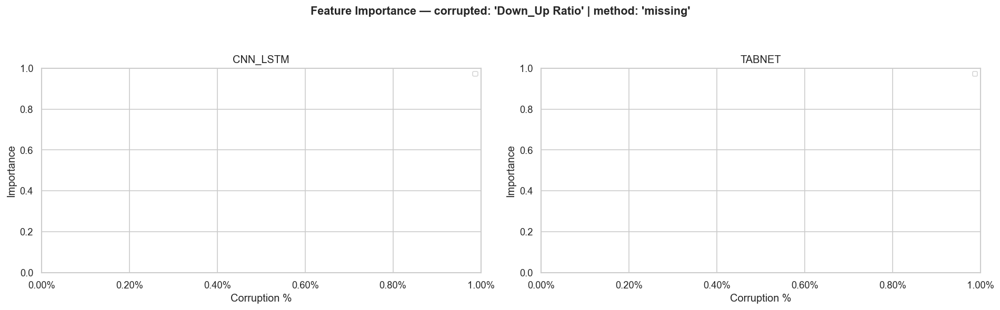

C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)
C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)


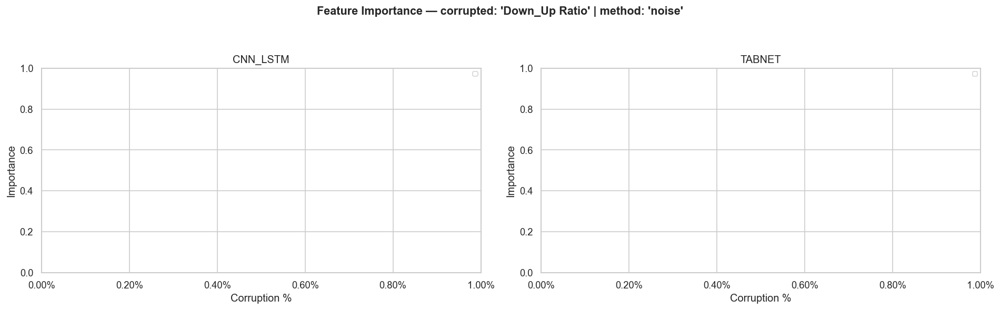

C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)
C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)


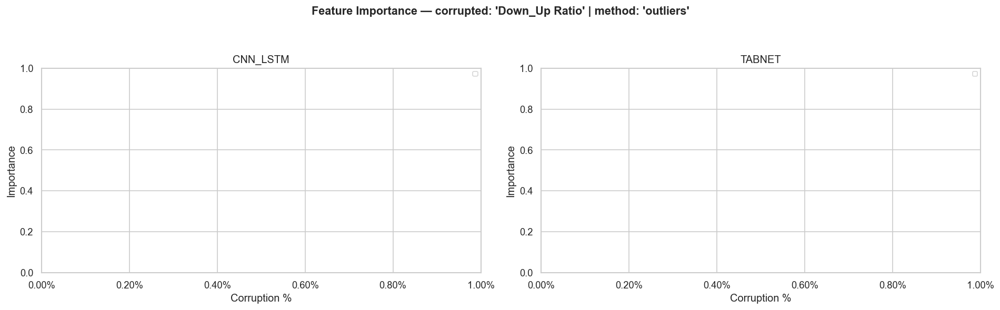

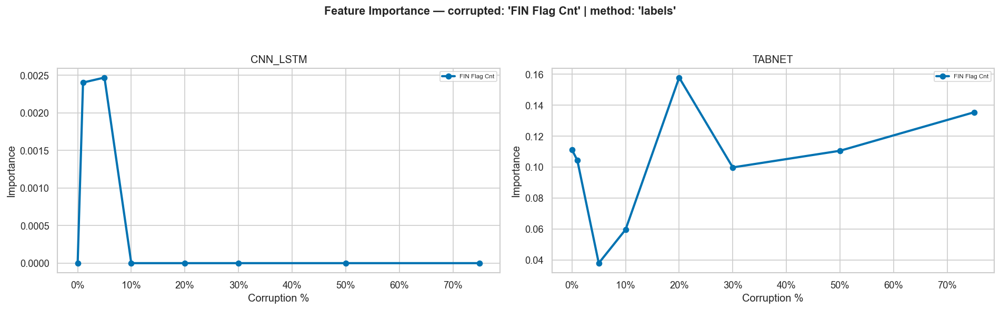

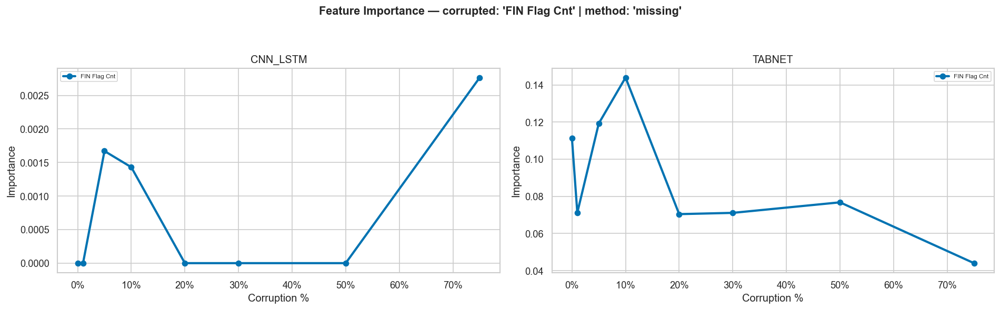

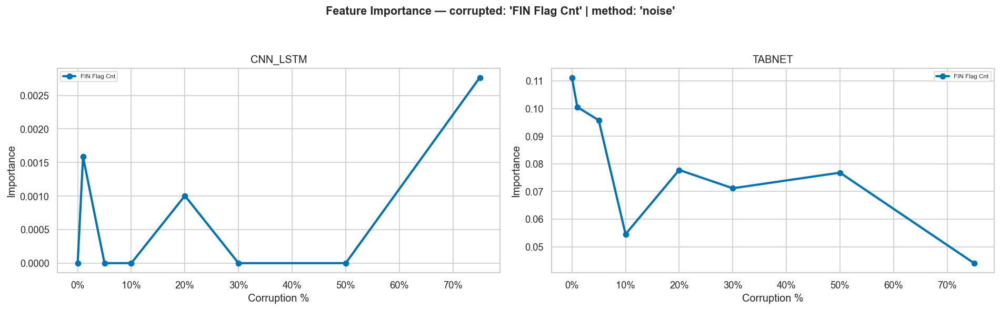

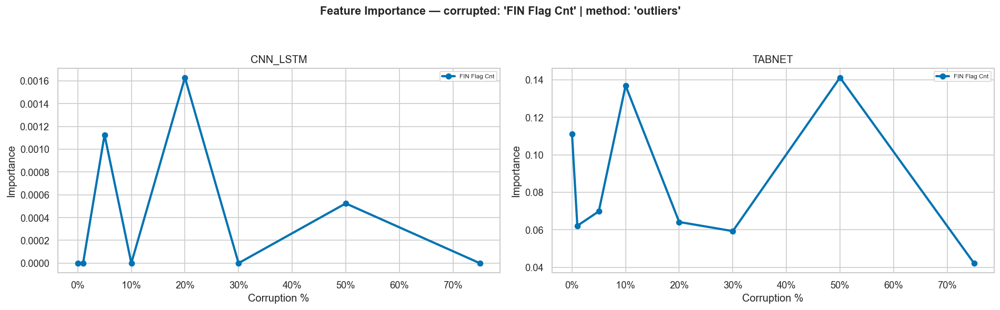

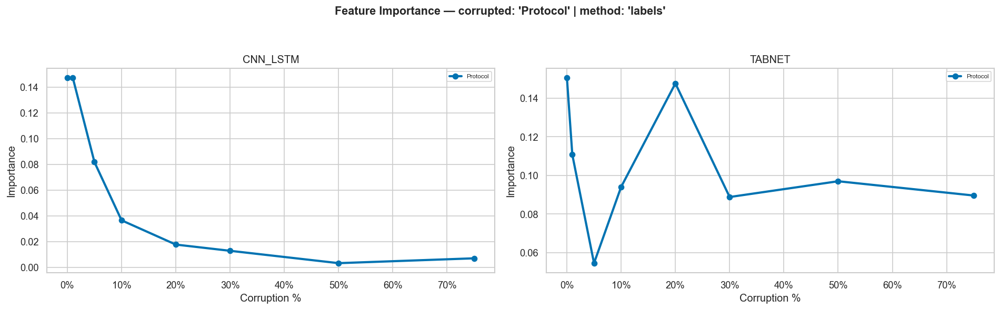

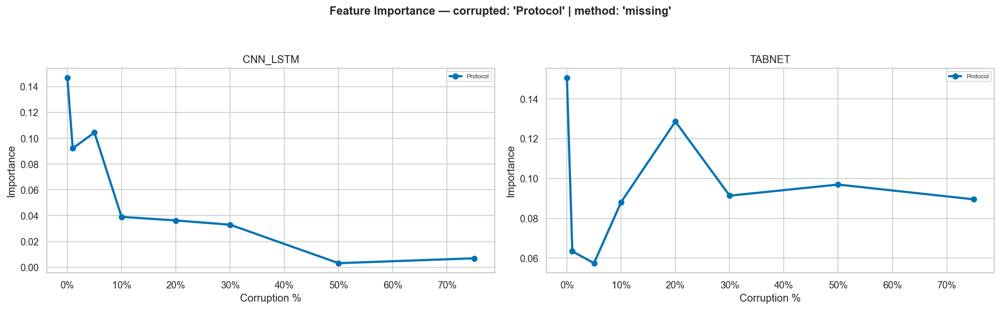

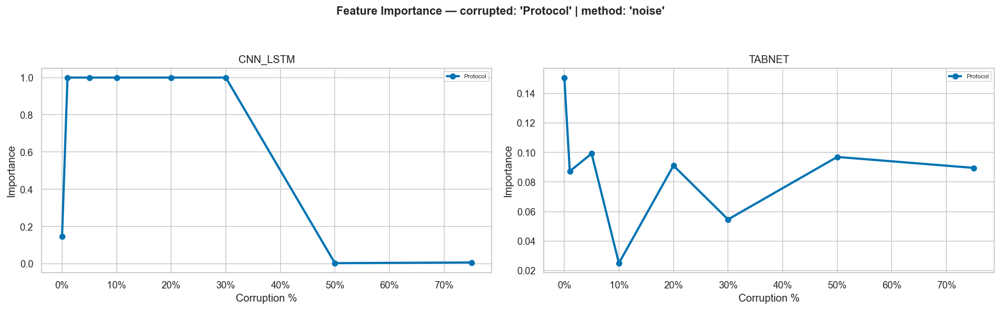

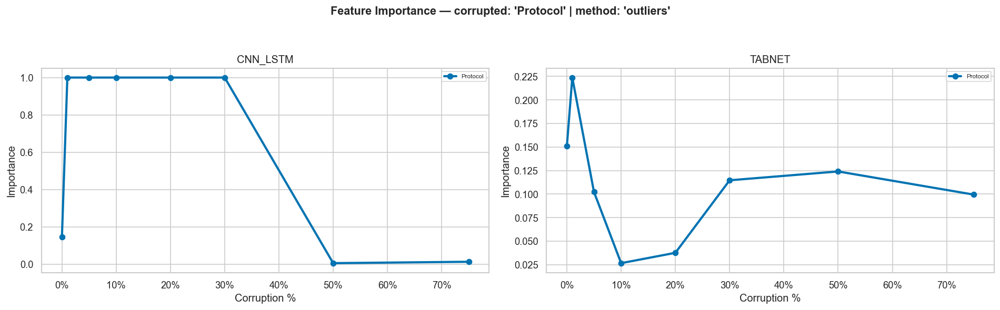

C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)
C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)


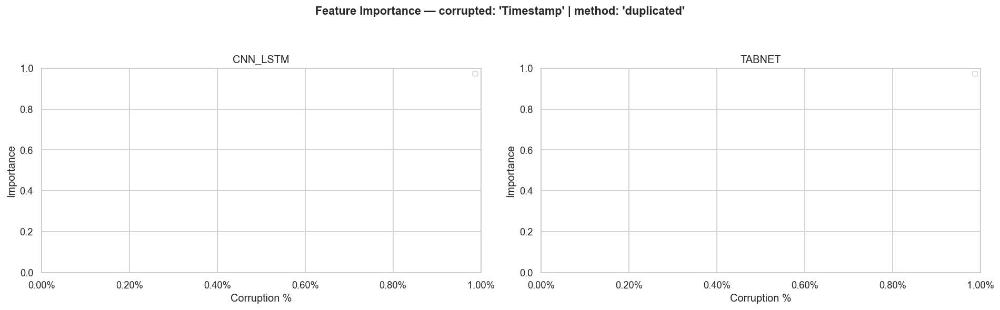

C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)
C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)


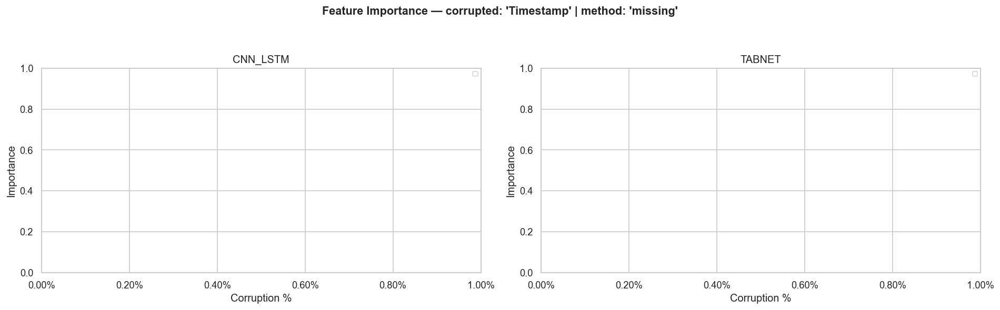

C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)
C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)


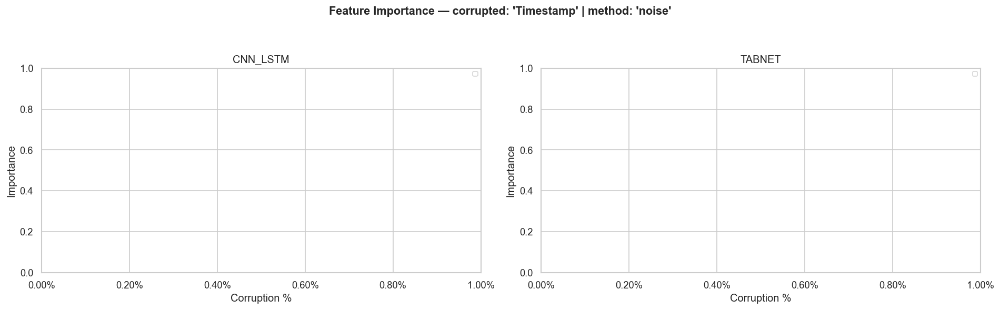

C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)
C:\Users\VIFCAVAL\AppData\Local\Temp\ipykernel_29904\2371468384.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=7, loc='best', ncol=2)


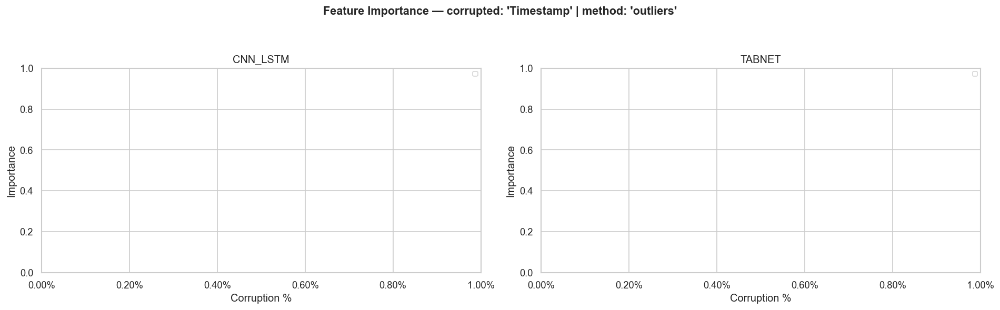

In [6]:
def plot_feature_importance_vs_pct(df_fi, only_dirty=False):
    """
    For each (dirty_feature, noise_method) combination, plot how feature
    importance changes as the corruption % increases.

    Parameters
    ----------
    only_dirty : bool
        If True, show only the corrupted feature's line.
        If False, show all features — the corrupted one as a solid line,
        the others as dashed lines.
    """
    combos = df_fi.groupby(['dirty_feature', 'noise_method']).size().index.tolist()
    models = sorted(df_fi['model_type'].unique())

    for dirty_feat, method in combos:
        sub = df_fi[(df_fi['dirty_feature'] == dirty_feat) &
                    (df_fi['noise_method'] == method)]
        if sub.empty:
            continue

        n_models = sub['model_type'].nunique()
        fig, axes = plt.subplots(1, n_models, figsize=(8 * n_models, 5), squeeze=False)
        fig.suptitle(f"Feature Importance — corrupted: '{dirty_feat}' | method: '{method}'",
                     fontsize=13, fontweight='bold')

        for idx, model in enumerate(models):
            ax = axes[0, idx]
            msub = sub[sub['model_type'] == model]
            if msub.empty:
                ax.set_visible(False)
                continue

            for feat_name, gdf in msub.groupby('feature'):
                gdf = gdf.sort_values('percentage')
                is_dirty = (feat_name == dirty_feat)

                if not is_dirty and only_dirty:
                    continue  # skip other features entirely

                marker    = 'o' if is_dirty else 's'
                lw        = 2.5 if is_dirty else 1.0
                linestyle = '-' if is_dirty else '--'
                alpha     = 1.0 if is_dirty else 0.5

                ax.plot(gdf['percentage'], gdf['importance'],
                        marker=marker, linewidth=lw, linestyle=linestyle,
                        alpha=alpha, label=feat_name)

            ax.set_title(model.upper())
            ax.set_xlabel('Corruption %')
            ax.set_ylabel('Importance')
            ax.legend(fontsize=7, loc='best', ncol=2)
            ax.xaxis.set_major_formatter(mticker.PercentFormatter(xmax=100))

        plt.tight_layout(rect=[0, 0, 1, 0.93])
        plt.show()


plot_feature_importance_vs_pct(df_fi, only_dirty=True)

## 3. Dirty-feature importance: confronto tra metodi di noise

Isoliamo l'importanza della **feature sporcata stessa** e confrontiamo come varia per ogni metodo di noise, separatamente per modello.

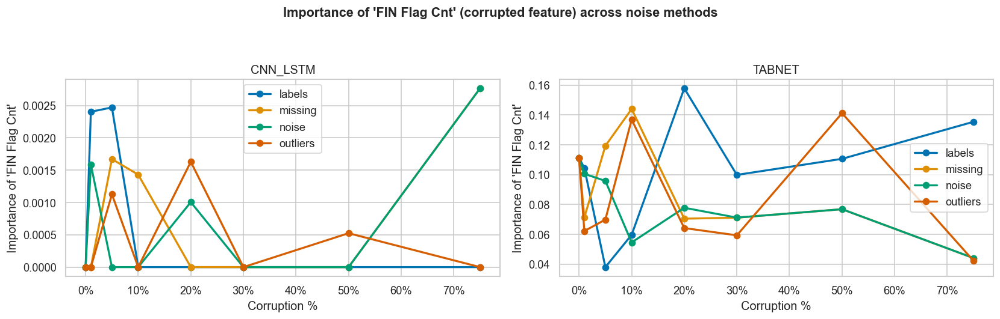

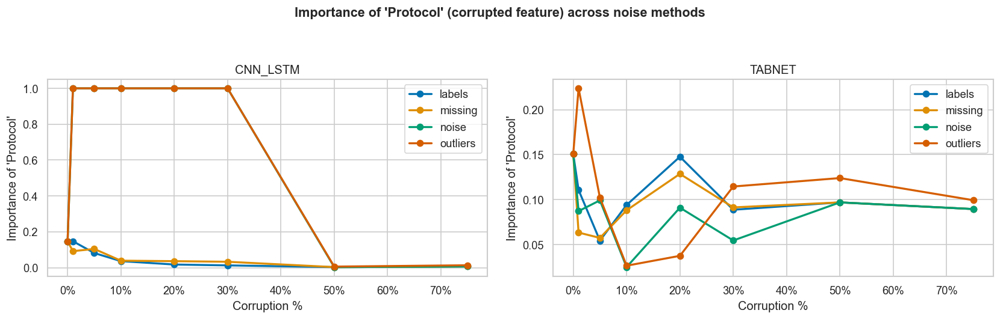

In [7]:
def plot_dirty_feature_importance_by_method(df_fi):
    """
    For each dirty_feature, plot its own importance vs % grouped by noise_method.
    One figure per (dirty_feature, model_type).
    """
    # Keep only rows where feature == dirty_feature
    self_imp = df_fi[df_fi['feature'] == df_fi['dirty_feature']].copy()
    if self_imp.empty:
        print("No self-importance data found (dirty feature not in importance dict).")
        return

    for dirty_feat in self_imp['dirty_feature'].unique():
        sub = self_imp[self_imp['dirty_feature'] == dirty_feat]
        models = sorted(sub['model_type'].unique())
        n = len(models)
        fig, axes = plt.subplots(1, n, figsize=(7 * n, 4.5), squeeze=False)
        fig.suptitle(f"Importance of '{dirty_feat}' (corrupted feature) across noise methods",
                     fontsize=13, fontweight='bold')

        for i, model in enumerate(models):
            ax = axes[0, i]
            msub = sub[sub['model_type'] == model]
            for method, gdf in msub.groupby('noise_method'):
                gdf = gdf.sort_values('percentage')
                ax.plot(gdf['percentage'], gdf['importance'],
                        marker='o', linewidth=2, label=method)
            ax.set_title(model.upper())
            ax.set_xlabel('Corruption %')
            ax.set_ylabel(f"Importance of '{dirty_feat}'")
            ax.legend()
            ax.xaxis.set_major_formatter(mticker.PercentFormatter(xmax=100))
        plt.tight_layout(rect=[0, 0, 1, 0.92])
        plt.show()


plot_dirty_feature_importance_by_method(df_fi)

## 4. Degradazione delle metriche globali al crescere della corruzione

Mostra come **Accuracy, F1, MCC** (binary e multiclass) peggiorano all'aumentare della percentuale di noise.  
Una riga per metrica, due colonne per task (binary / multiclass), una linea per metodo di noise.

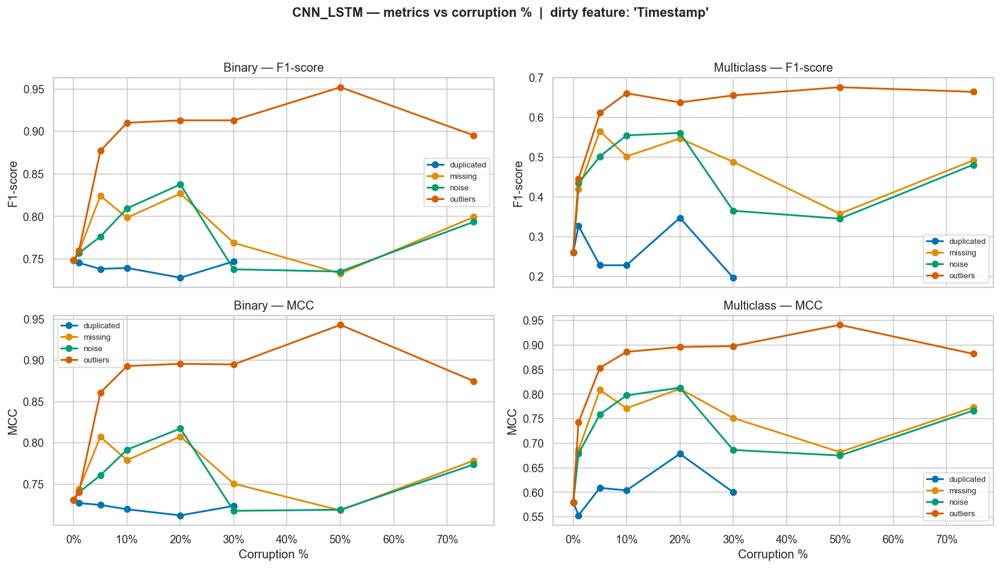

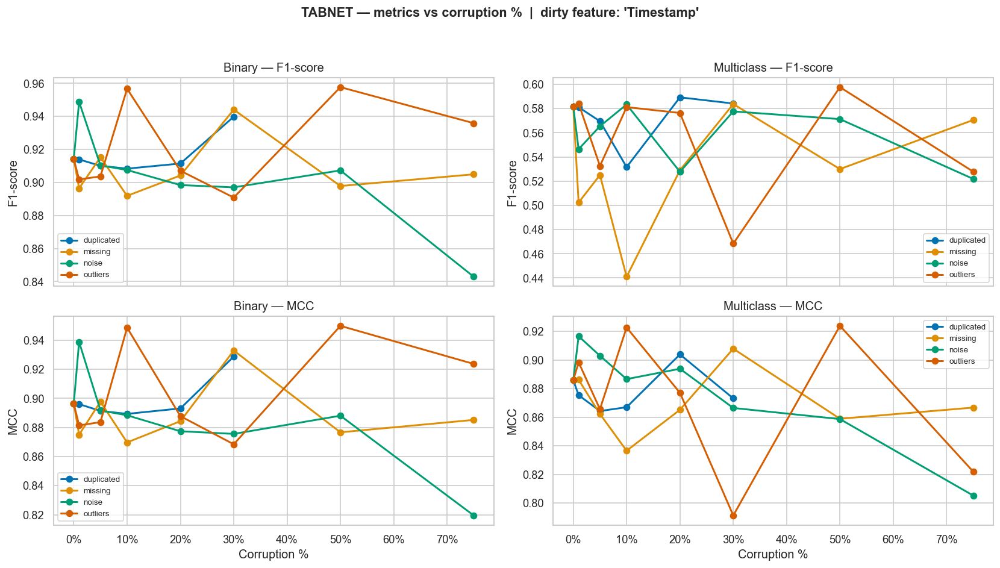

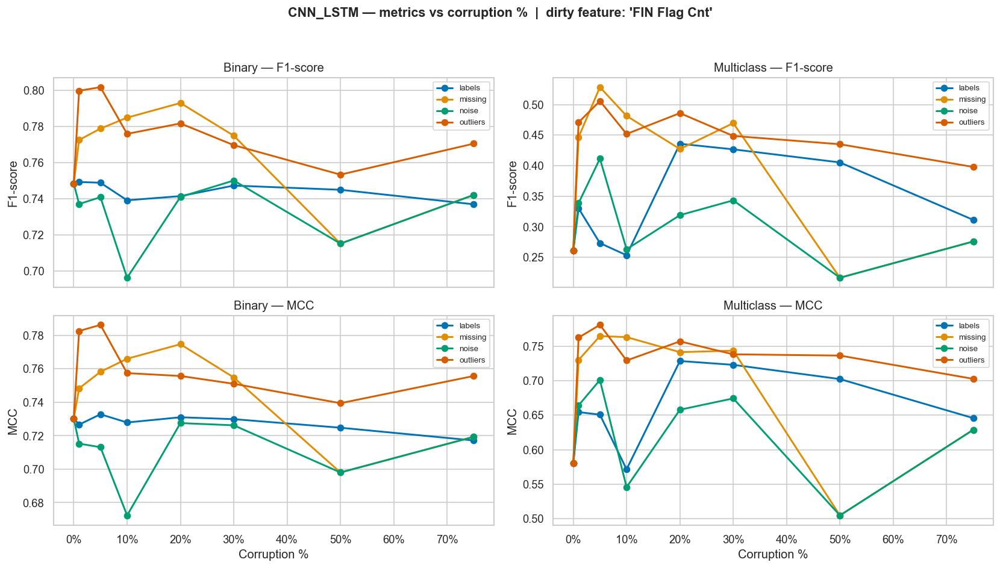

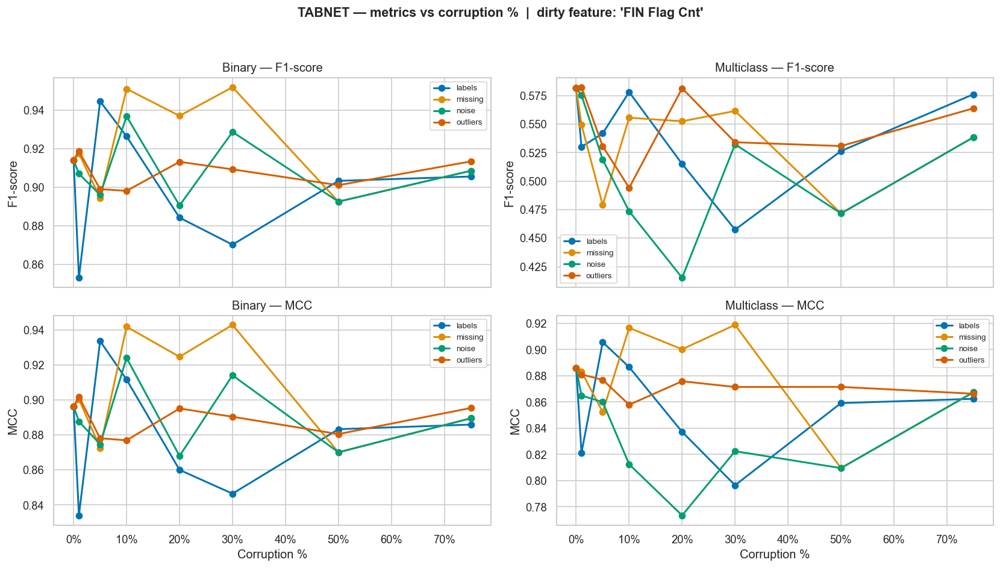

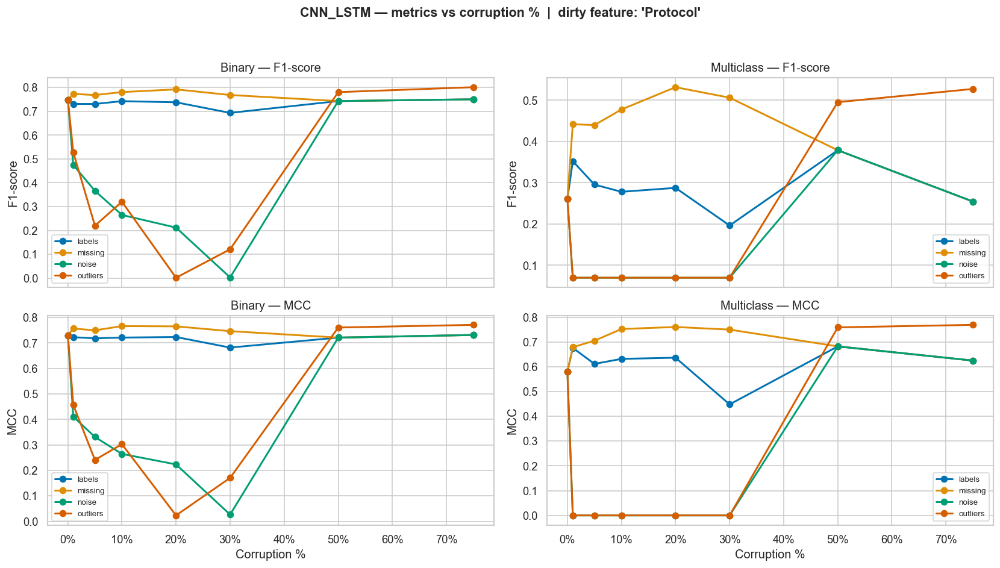

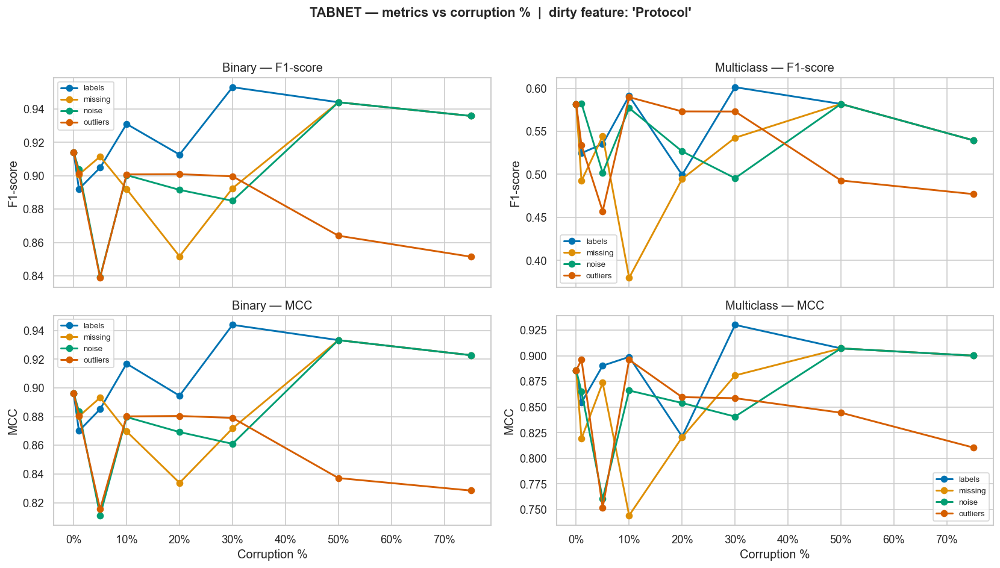

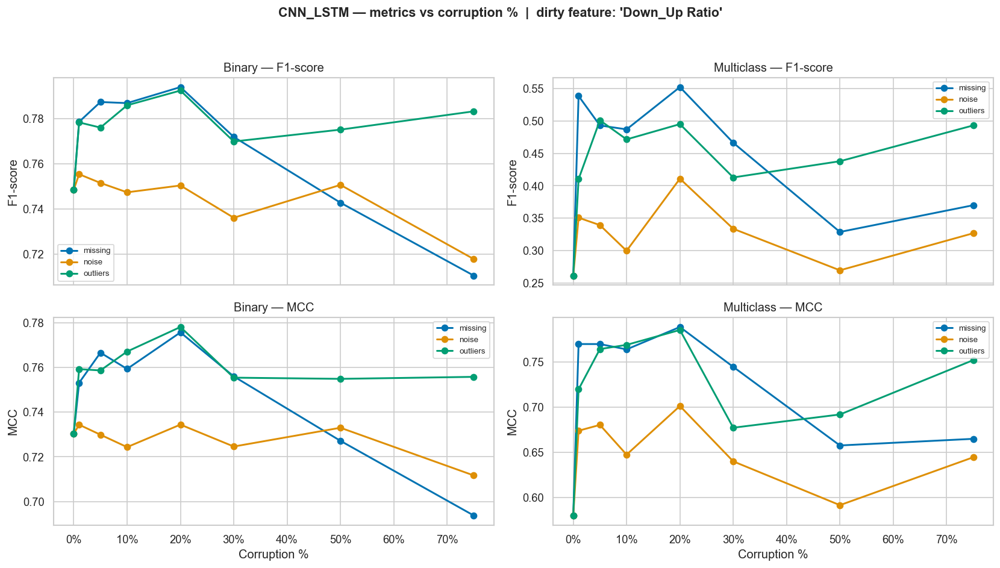

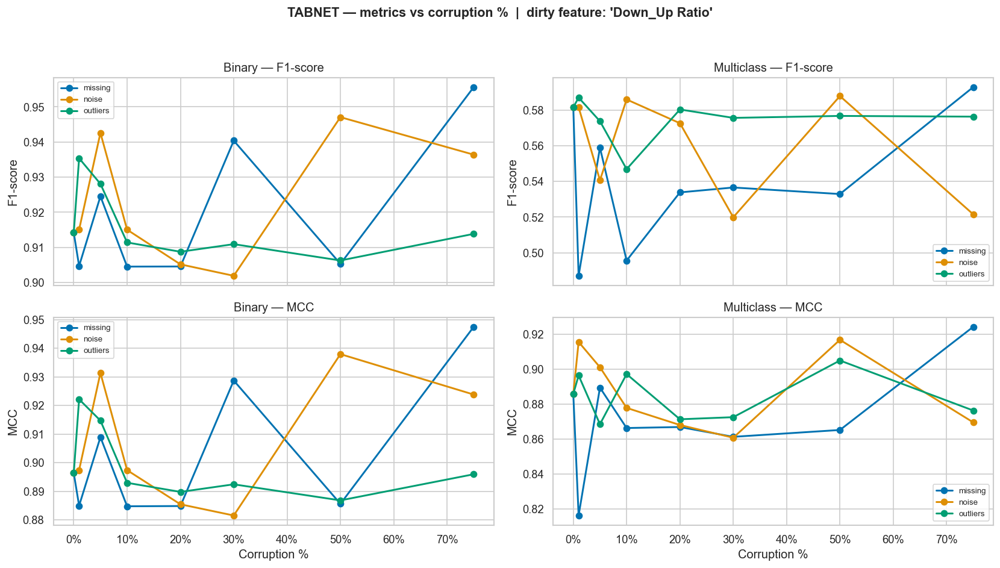

In [8]:
def plot_metrics_degradation(df_exp):
    """
    For each (dirty_feature, model_type), plot accuracy / f1 / mcc
    for both binary and multiclass tasks vs corruption %.
    One line per noise_method.
    """
    metric_pairs = [
        #('binary_accuracy',  'multiclass_accuracy',  'Accuracy'),
        ('binary_f1',        'multiclass_f1',        'F1-score'),
        ('binary_mcc',       'multiclass_mcc',       'MCC'),
    ]

    for dirty_feat in df_exp['dirty_feature'].unique():
        for model in sorted(df_exp['model_type'].unique()):
            sub = df_exp[(df_exp['dirty_feature'] == dirty_feat) &
                         (df_exp['model_type'] == model)]
            if sub.empty:
                continue

            n_rows = len(metric_pairs)
            fig, axes = plt.subplots(n_rows, 2, figsize=(14, 4 * n_rows), sharex=True)
            fig.suptitle(f"{model.upper()} — metrics vs corruption %  |  dirty feature: '{dirty_feat}'",
                         fontsize=13, fontweight='bold')

            for r, (col_bin, col_mul, label) in enumerate(metric_pairs):
                for c, col in enumerate([col_bin, col_mul]):
                    ax = axes[r, c]
                    task = 'Binary' if c == 0 else 'Multiclass'
                    for method, gdf in sub.groupby('noise_method'):
                        gdf = gdf.sort_values('percentage')
                        ax.plot(gdf['percentage'], gdf[col],
                                marker='o', linewidth=1.8, label=method)
                    ax.set_ylabel(label)
                    ax.set_title(f'{task} — {label}')
                    ax.legend(fontsize=8)
                    ax.xaxis.set_major_formatter(mticker.PercentFormatter(xmax=100))
                    if r == n_rows - 1:
                        ax.set_xlabel('Corruption %')

            plt.tight_layout(rect=[0, 0, 1, 0.95])
            plt.show()


plot_metrics_degradation(df_experiments)

## 5. Heatmap riassuntiva: Mean MCC per (metodo × percentuale)

Una heatmap per ogni combinazione **(dirty_feature, model_type)** che mostra il **mean MCC** (media tra binary e multiclass) su una griglia *noise_method × percentage*.

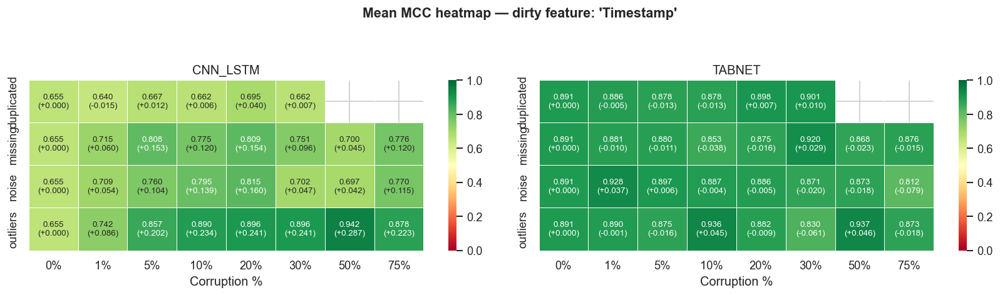

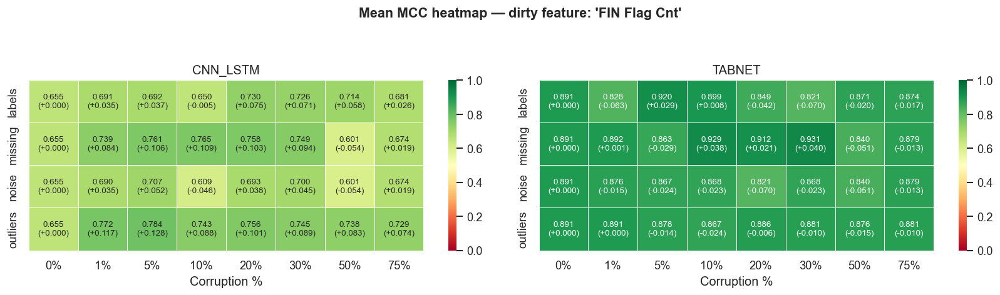

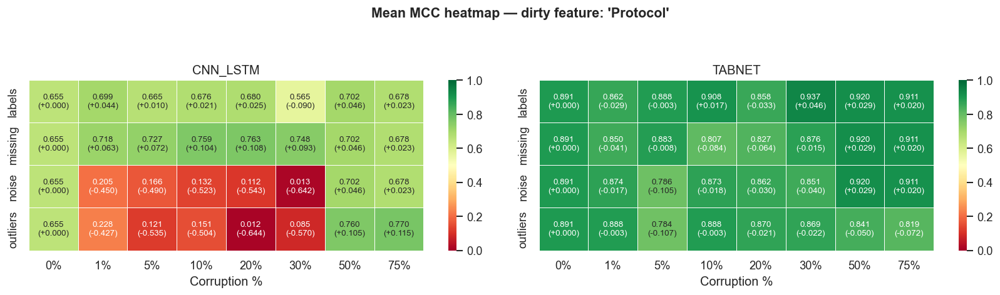

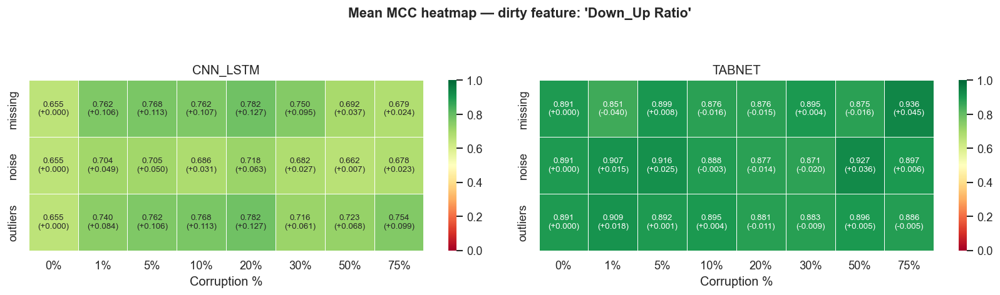

In [9]:
def plot_mcc_heatmaps(df_exp):
    """
    Heatmap of mean_mcc with noise_method on rows and percentage on columns.
    Each cell shows: value (Δ vs baseline).
    One heatmap per (dirty_feature, model_type).
    """
    for dirty_feat in df_exp['dirty_feature'].unique():
        models = sorted(df_exp['model_type'].unique())
        n = len(models)
        fig, axes = plt.subplots(1, n, figsize=(7 * n, 4), squeeze=False)
        fig.suptitle(f"Mean MCC heatmap — dirty feature: '{dirty_feat}'",
                     fontsize=13, fontweight='bold')

        for i, model in enumerate(models):
            ax = axes[0, i]
            sub = df_exp[(df_exp['dirty_feature'] == dirty_feat) &
                         (df_exp['model_type'] == model)]
            if sub.empty:
                ax.set_visible(False)
                continue

            # Baseline MCC for this model (percentage == 0)
            base_rows = sub[sub['percentage'] == 0.0]
            base_mcc = base_rows['mean_mcc'].iloc[0] if not base_rows.empty else np.nan

            pivot = sub.pivot_table(index='noise_method', columns='percentage',
                                    values='mean_mcc', aggfunc='mean')

            # Build annotation strings: "0.891\n(−0.023)"
            annot_labels = pivot.copy().astype(str)
            for r in pivot.index:
                for c in pivot.columns:
                    val = pivot.loc[r, c]
                    if pd.isna(val) or pd.isna(base_mcc):
                        annot_labels.loc[r, c] = f'{val:.3f}'
                    else:
                        delta = val - base_mcc
                        sign = '+' if delta >= 0 else ''
                        annot_labels.loc[r, c] = f'{val:.3f}\n({sign}{delta:.3f})'

            pivot.columns = [f'{c:.0f}%' for c in pivot.columns]
            annot_labels.columns = pivot.columns

            sns.heatmap(pivot, annot=annot_labels, fmt='', cmap='RdYlGn',
                        ax=ax, vmin=0, vmax=1, linewidths=0.5,
                        annot_kws={'fontsize': 8})
            ax.set_title(model.upper())
            ax.set_xlabel('Corruption %')
            ax.set_ylabel('')

        plt.tight_layout(rect=[0, 0, 1, 0.92])
        plt.show()


plot_mcc_heatmaps(df_experiments)

## 6. Confronto TabNet vs CNN-LSTM: robustezza al noise

Confronto diretto tra i due modelli per ogni (dirty_feature, noise_method): chi degrada di più al crescere della corruzione?

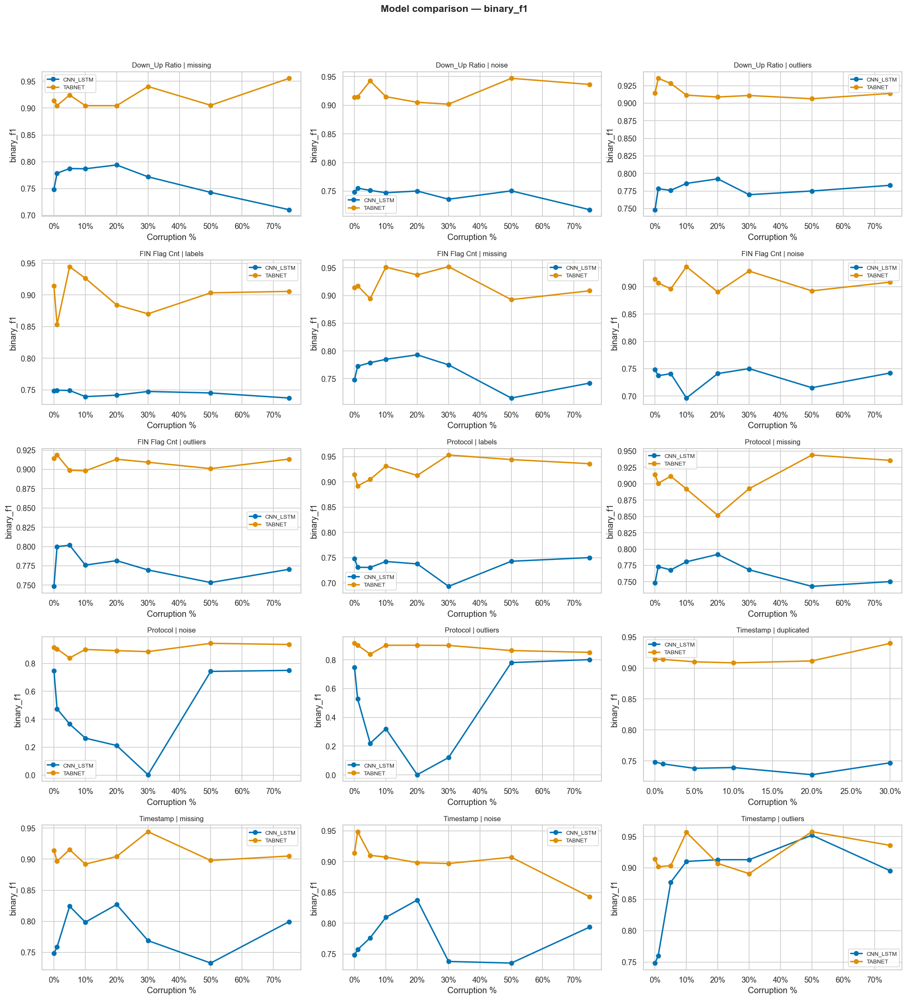

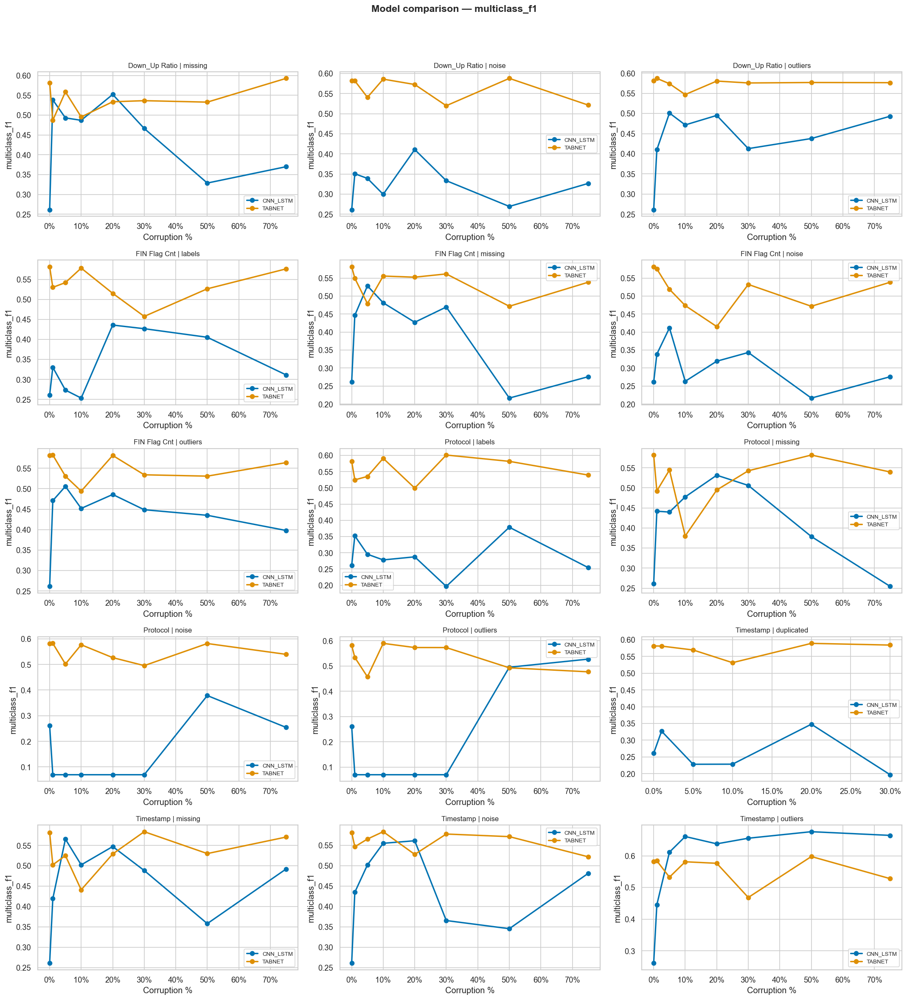

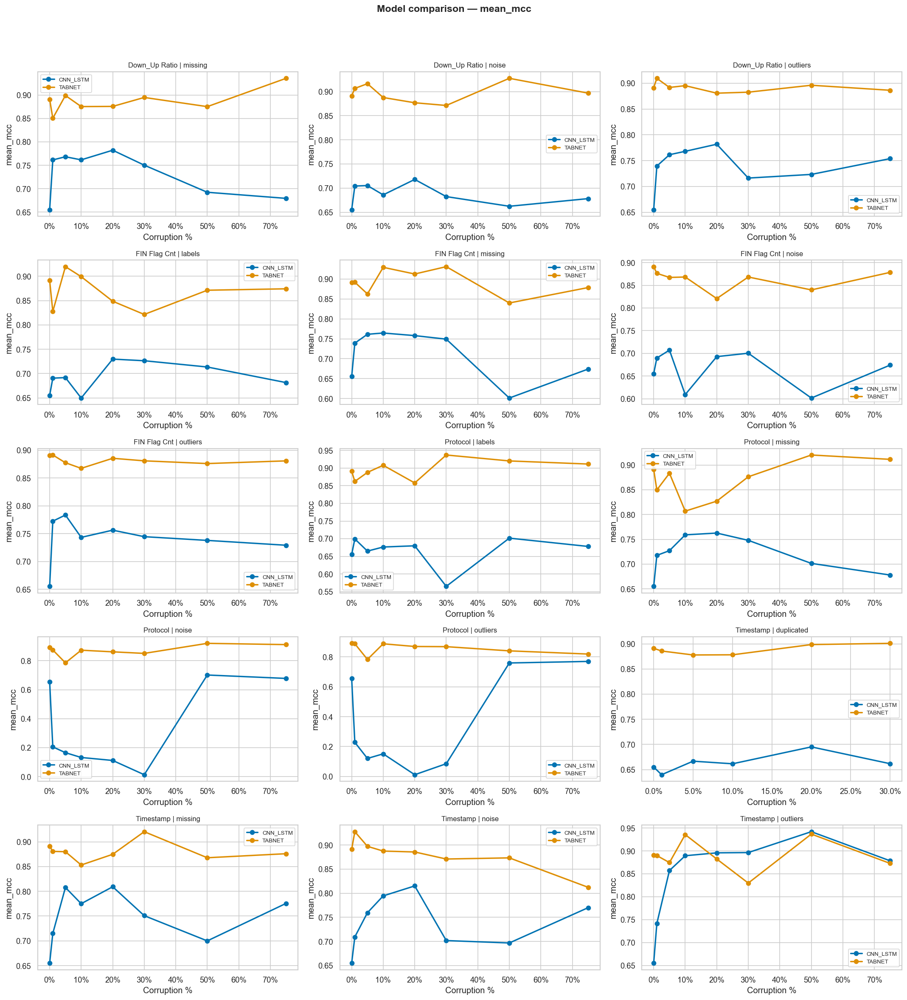

In [10]:
def plot_model_comparison(df_exp, metric='binary_f1'):
    """
    Side-by-side comparison of TabNet vs CNN-LSTM for a given metric.
    One subplot per (dirty_feature, noise_method).
    """
    combos = df_exp.groupby(['dirty_feature', 'noise_method']).size().index.tolist()
    n_combos = len(combos)
    ncols = min(3, n_combos)
    nrows = -(-n_combos // ncols)  # ceiling division

    fig, axes = plt.subplots(nrows, ncols, figsize=(6 * ncols, 4 * nrows), squeeze=False)
    fig.suptitle(f"Model comparison — {metric}", fontsize=14, fontweight='bold')

    for idx, (dirty_feat, method) in enumerate(combos):
        ax = axes[idx // ncols, idx % ncols]
        sub = df_exp[(df_exp['dirty_feature'] == dirty_feat) &
                     (df_exp['noise_method'] == method)]
        for model, gdf in sub.groupby('model_type'):
            gdf = gdf.sort_values('percentage')
            ax.plot(gdf['percentage'], gdf[metric],
                    marker='o', linewidth=2, label=model.upper())
        ax.set_title(f"{dirty_feat} | {method}", fontsize=10)
        ax.set_xlabel('Corruption %')
        ax.set_ylabel(metric)
        ax.legend(fontsize=8)
        ax.xaxis.set_major_formatter(mticker.PercentFormatter(xmax=100))

    # Hide unused axes
    for idx in range(n_combos, nrows * ncols):
        axes[idx // ncols, idx % ncols].set_visible(False)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


plot_model_comparison(df_experiments, metric='binary_f1')
plot_model_comparison(df_experiments, metric='multiclass_f1')
plot_model_comparison(df_experiments, metric='mean_mcc')

## 7. Tabella riassuntiva

Riepilogo numerico di tutti gli esperimenti, ordinato per degradazione (worst → best).

In [11]:
summary_cols = [
    'model_type', 'noise_method', 'dirty_feature', 'percentage',
    'binary_accuracy', 'binary_f1', 'binary_mcc',
    'multiclass_accuracy', 'multiclass_f1', 'multiclass_mcc',
    'mean_mcc',
]

df_summary = df_experiments[summary_cols].copy()
df_summary = df_summary.sort_values('mean_mcc', ascending=True).reset_index(drop=True)

# Style: highlight worst rows
df_summary.style.background_gradient(cmap='RdYlGn', subset=[
    'binary_f1', 'multiclass_f1', 'mean_mcc'
])

,model_type,noise_method,dirty_feature,percentage,binary_accuracy,binary_f1,binary_mcc,multiclass_accuracy,multiclass_f1,multiclass_mcc,mean_mcc
0,cnn_lstm,outliers,Protocol,20.000000,0.829699,0.001307,0.023294,0.829587,0.069758,0.000000,0.011647
1,cnn_lstm,noise,Protocol,30.000000,0.829773,0.002612,0.026583,0.829624,0.069760,0.000000,0.013291
2,cnn_lstm,outliers,Protocol,30.000000,0.834900,0.120696,0.170582,0.829587,0.069758,0.000000,0.085291
3,cnn_lstm,noise,Protocol,20.000000,0.837129,0.211794,0.223452,0.829624,0.069760,0.000000,0.111726
4,cnn_lstm,outliers,Protocol,5.000000,0.839878,0.219768,0.241129,0.829587,0.069758,0.000000,0.120565
5,cnn_lstm,noise,Protocol,10.000000,0.840993,0.264857,0.264576,0.829624,0.069760,0.000000,0.132288
6,cnn_lstm,outliers,Protocol,10.000000,0.844485,0.320234,0.302740,0.829587,0.069758,0.000000,0.151370
7,cnn_lstm,noise,Protocol,5.000000,0.846603,0.366037,0.331045,0.829624,0.069760,0.000000,0.165523
8,cnn_lstm,noise,Protocol,1.000000,0.854887,0.474718,0.410902,0.829624,0.069760,0.000000,0.205451
9,cnn_lstm,outliers,Protocol,1.000000,0.861203,0.527686,0.456773,0.829587,0.069758,0.000000,0.228387


## 8. Binary Confusion Matrix — Baseline vs Esperimenti Sospetti

Istogramma stacked (stile *Class Prediction Error*) che mostra per ogni classe reale (Benign / Malicious) quanti campioni sono stati predetti correttamente e quanti erroneamente.

Vengono confrontati con la baseline solo gli esperimenti che soddisfano almeno una delle condizioni:
1. **F1 binary > baseline** — il modello sembra migliorare, ma potrebbe nascondere più falsi positivi
2. **F1 binary ≥ baseline − tolleranza** *e* **FP > baseline** — F1 simile ma con più falsi positivi (benign classificati come malicious)

In questo caso per il nostro dominio specifico della cybersicurezza è interessante andare a vedere come alcuni modelli al quale abbiamo inserito noise producono risultati migliori che della baseline. 
Ossia alcuni modelli (oltre a quei modelli che hanno direttamente un f1-score più alto rispetto che la baseline) hanno una una differenza di falsi positivi (ossia )


  CNN_LSTM — 71 esperimenti sospetti vs baseline
  Baseline: F1=0.7484  |  FP=170


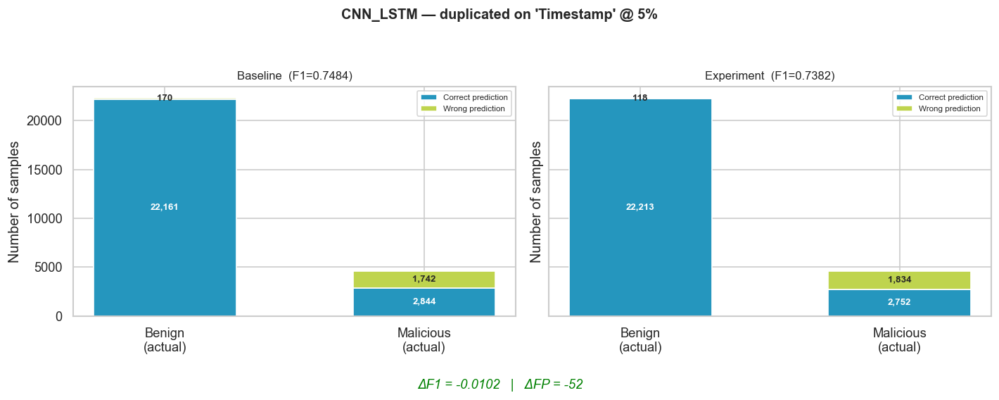

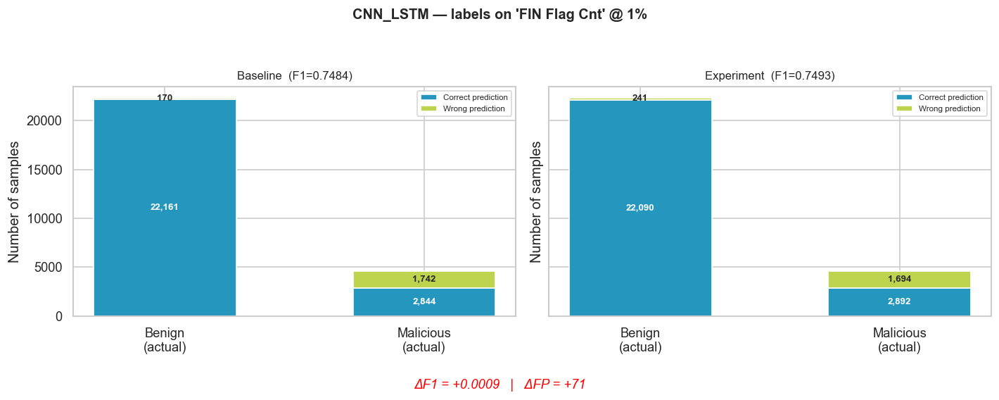

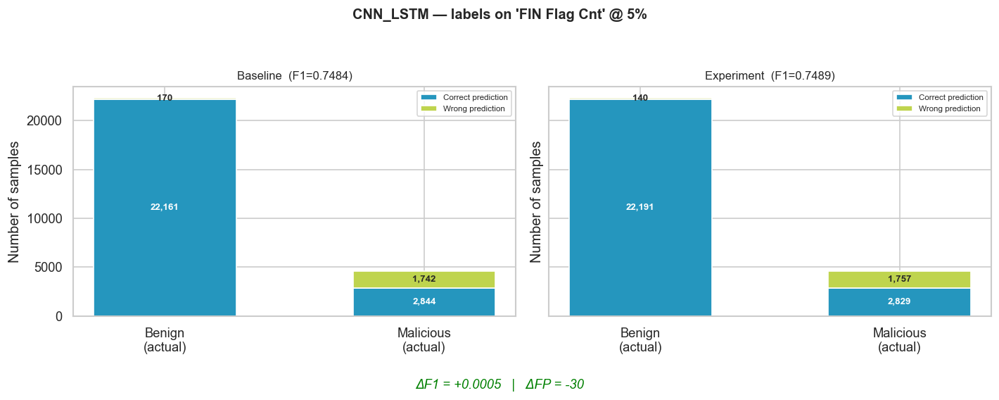

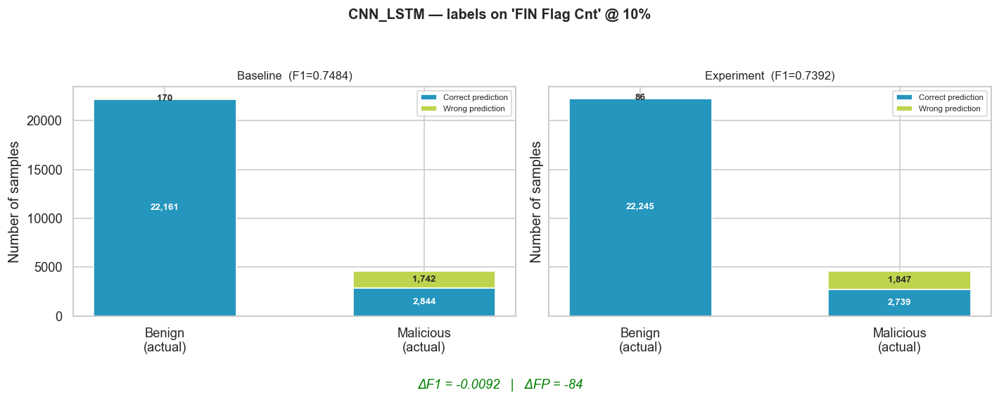

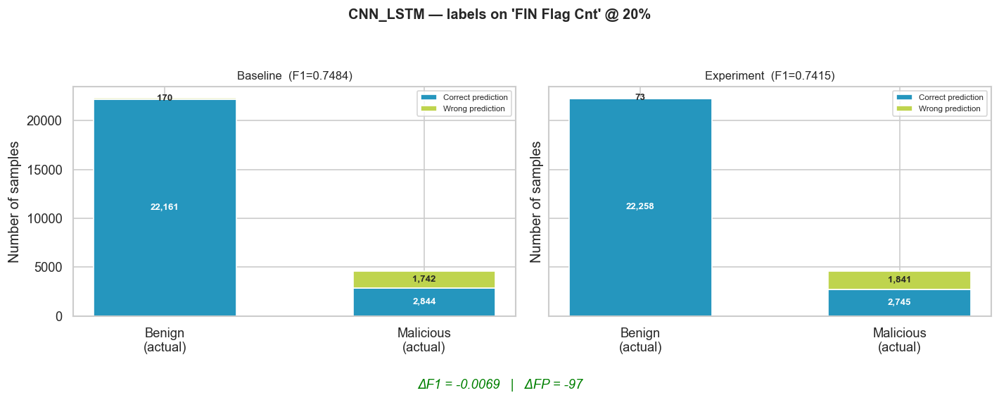

...

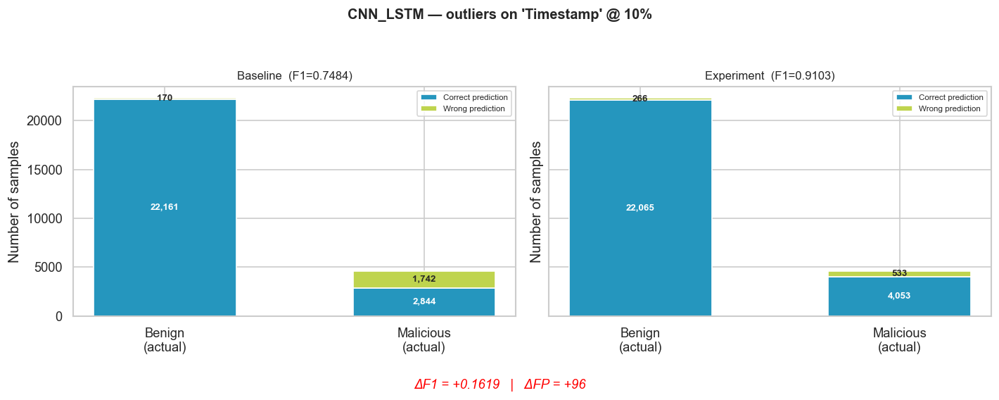

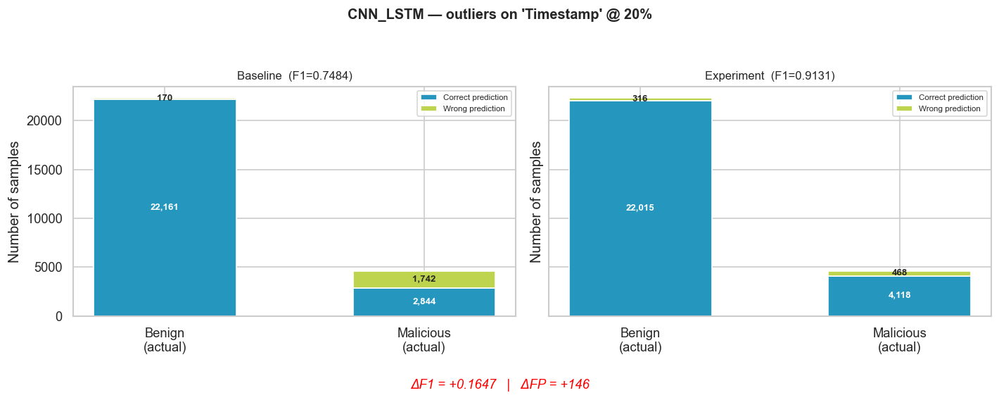

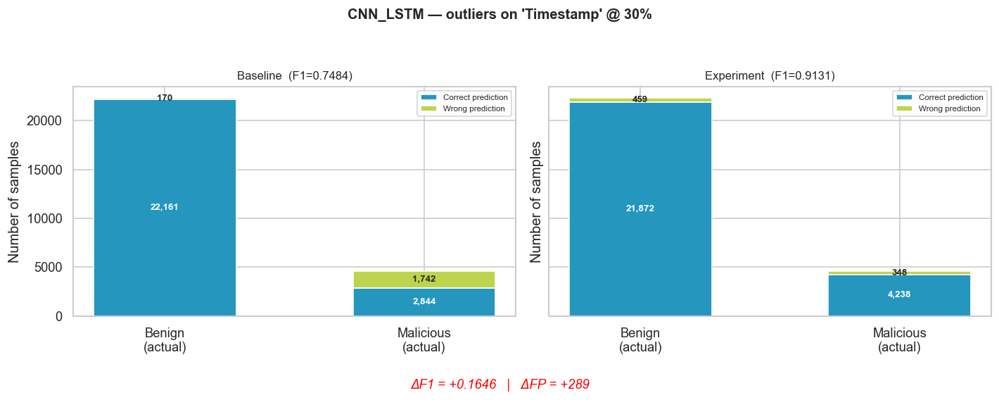

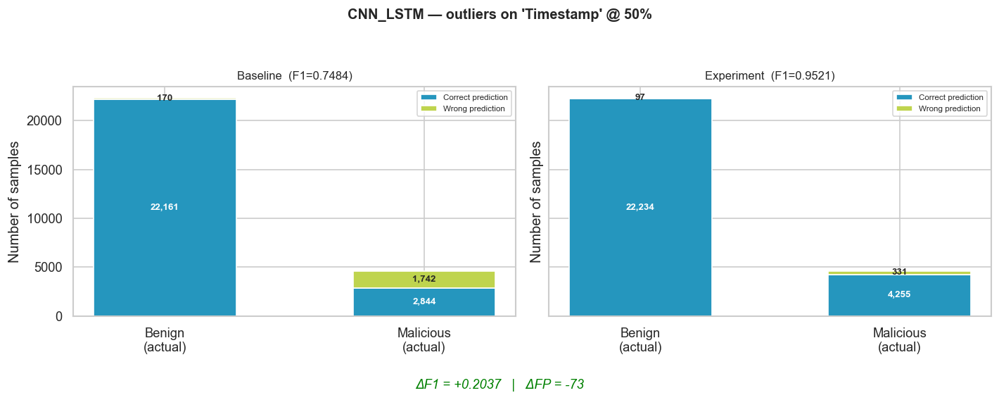

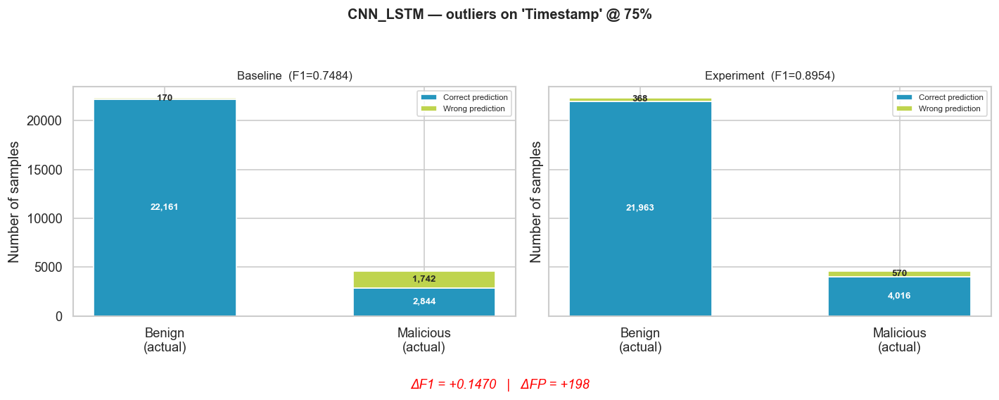


  TABNET — 34 esperimenti sospetti vs baseline
  Baseline: F1=0.9142  |  FP=4,404


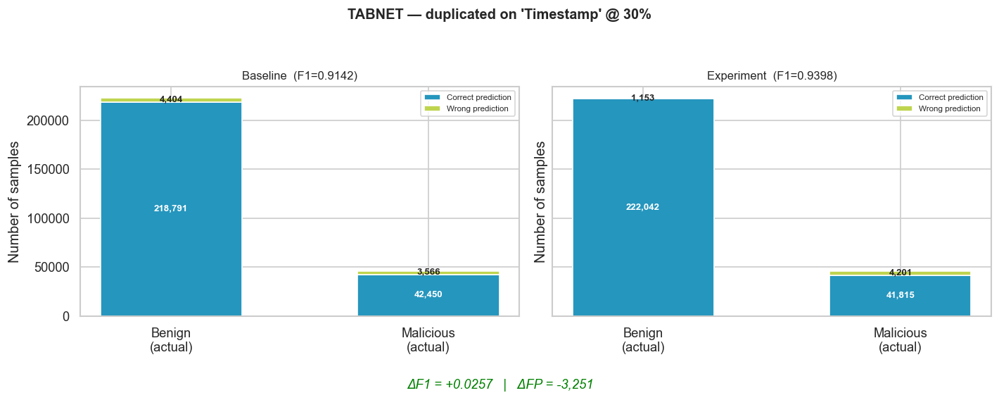

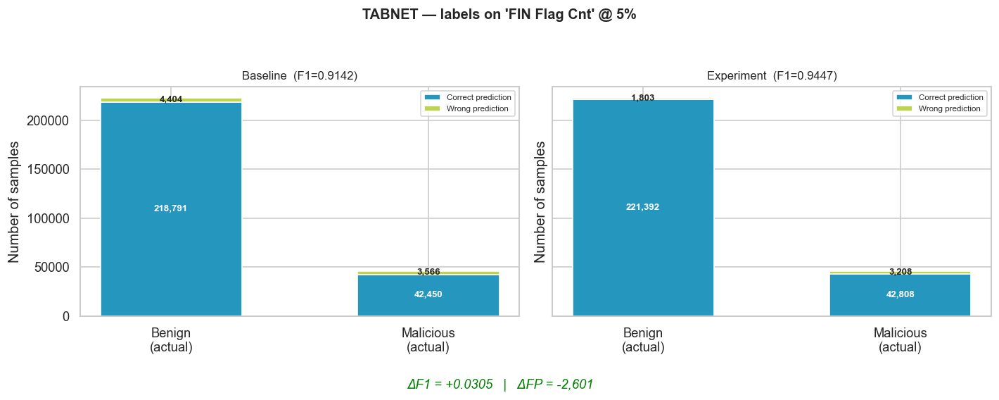

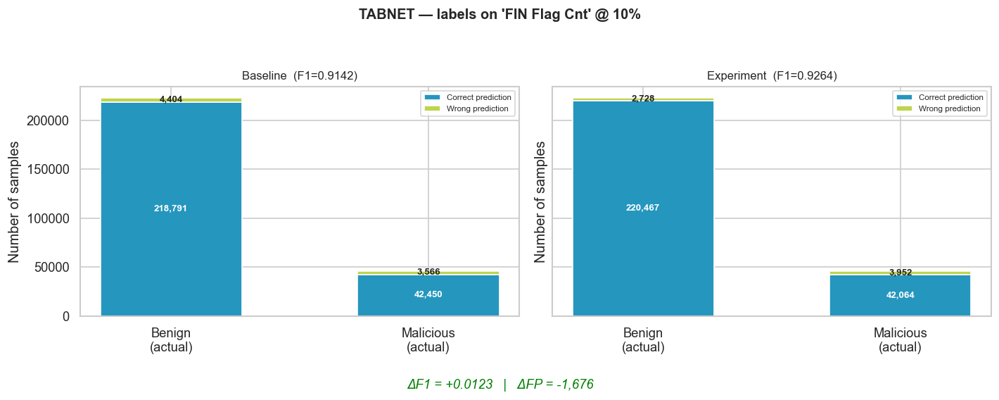

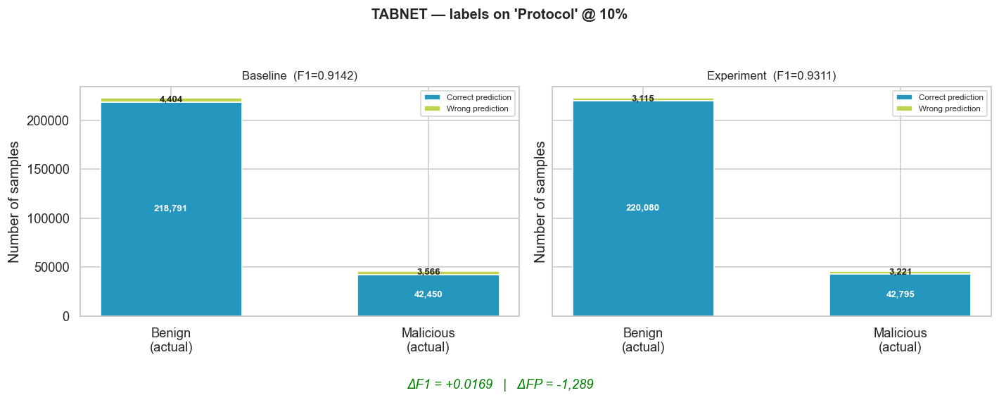

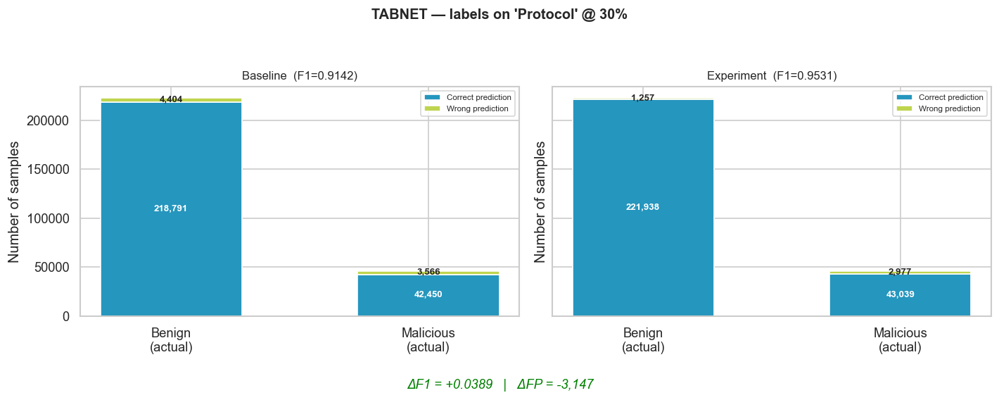

...

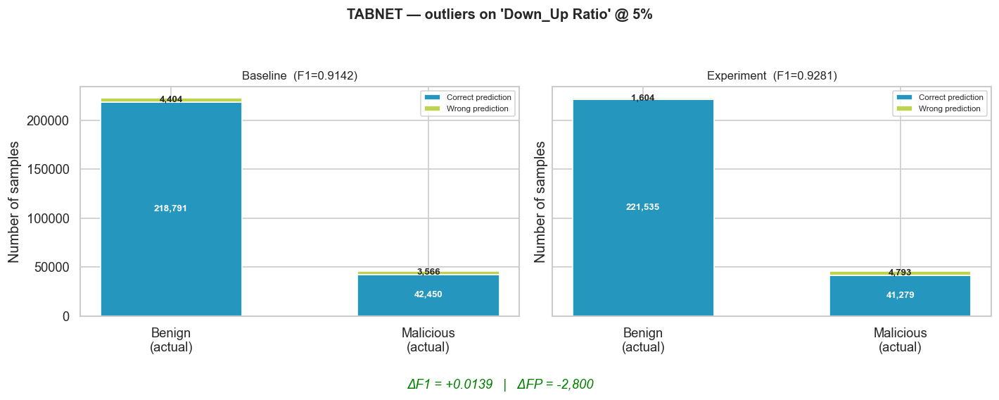

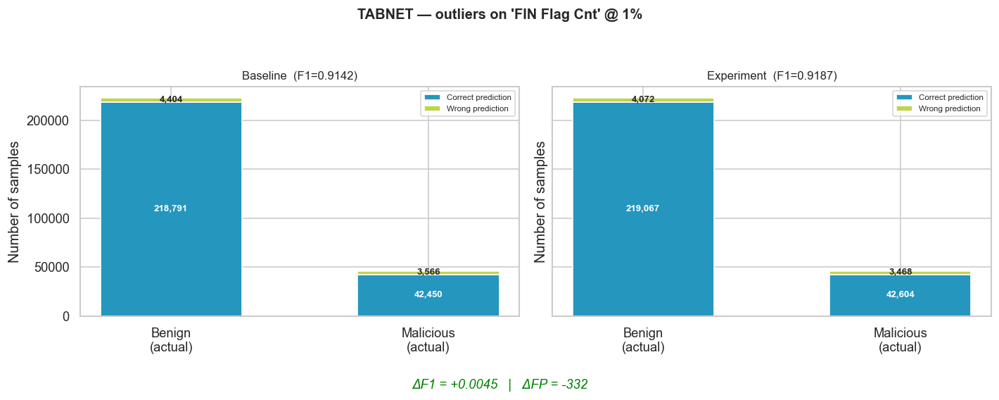

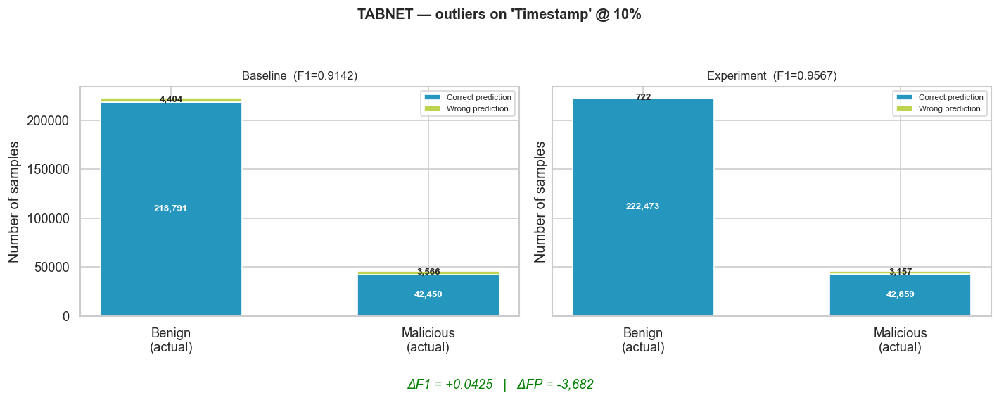

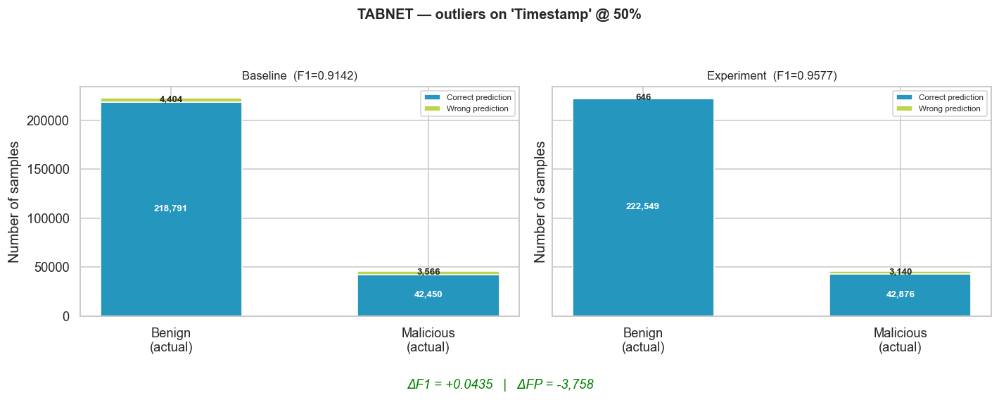

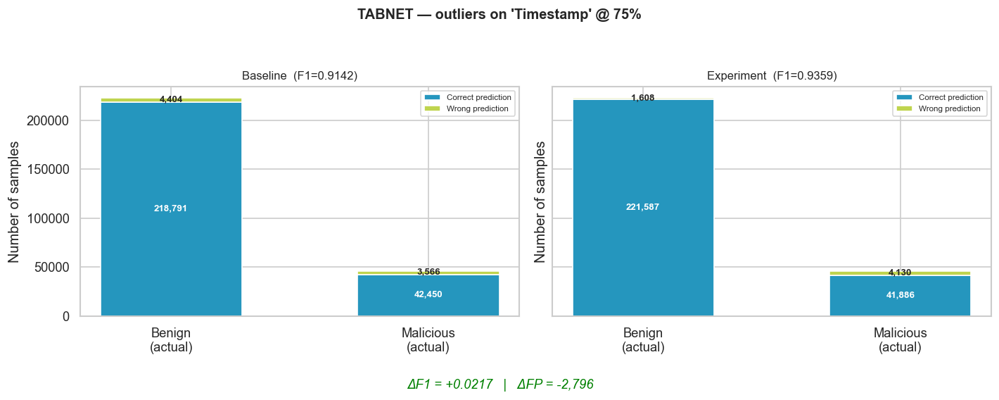

In [12]:
def _make_cm_bar(ax, tn, fp, fn, tp, title):
    """Draw a single stacked bar chart for a binary confusion matrix."""
    # Actual Benign  = TN (predicted benign) + FP (predicted malicious)
    # Actual Malicious = FN (predicted benign) + TP (predicted malicious)
    classes = ['Benign\n(actual)', 'Malicious\n(actual)']
    correct   = [tn, tp]
    incorrect = [fp, fn]

    bar_w = 0.55
    x = np.arange(len(classes))

    ax.bar(x, correct,   bar_w, label='Correct prediction', color='#2596be')
    ax.bar(x, incorrect, bar_w, bottom=correct, label='Wrong prediction', color='#bfd44e')

    # Annotate counts
    for i in range(len(classes)):
        if correct[i] > 0:
            ax.text(i, correct[i] / 2, f'{correct[i]:,}', ha='center', va='center',
                    fontsize=8, fontweight='bold', color='white')
        if incorrect[i] > 0:
            ax.text(i, correct[i] + incorrect[i] / 2, f'{incorrect[i]:,}',
                    ha='center', va='center', fontsize=8, fontweight='bold')

    ax.set_xticks(x)
    ax.set_xticklabels(classes)
    ax.set_ylabel('Number of samples')
    ax.set_title(title, fontsize=10)
    ax.legend(fontsize=7, loc='upper right')


def plot_baseline_vs_suspicious(df_exp, f1_tolerance=0.02):
    """
    For each model_type, find experiments where:
      (a) binary_f1 > baseline_f1, OR
      (b) binary_f1 >= baseline_f1 - f1_tolerance  AND  FP < baseline_FP

    Then plot the baseline confusion-matrix bar chart next to each suspicious
    experiment's bar chart for visual comparison.
    """
    for model in sorted(df_exp['model_type'].unique()):
        mdf = df_exp[df_exp['model_type'] == model]

        # Baseline row (percentage == 0) — pick any (they're all identical)
        base = mdf[mdf['percentage'] == 0.0].iloc[0]
        base_f1 = base['binary_f1']
        base_fp = base['FP']

        # Filter suspicious experiments (pct > 0)
        exps = mdf[mdf['percentage'] > 0].copy()
        cond_better_f1 = exps['binary_f1'] > base_f1
        cond_similar_f1_more_fp = (
            (exps['binary_f1'] >= base_f1 - f1_tolerance) &
            (exps['FP'] < base_fp)
        )
        suspicious = exps[cond_better_f1 | cond_similar_f1_more_fp]

        if suspicious.empty:
            print(f"\n{model.upper()}: nessun esperimento sospetto trovato "
                  f"(baseline F1={base_f1:.4f}, FP={int(base_fp):,})")
            continue

        print(f"\n{'='*70}")
        print(f"  {model.upper()} — {len(suspicious)} esperimenti sospetti vs baseline")
        print(f"  Baseline: F1={base_f1:.4f}  |  FP={int(base_fp):,}")
        print(f"{'='*70}")

        for _, row in suspicious.iterrows():
            fig, axes = plt.subplots(1, 2, figsize=(12, 4.5), sharey=True)
            fig.suptitle(
                f"{model.upper()} — {row['noise_method']} on '{row['dirty_feature']}' "
                f"@ {row['percentage']:.0f}%",
                fontsize=12, fontweight='bold'
            )

            # Baseline
            _make_cm_bar(axes[0],
                         int(base['TN']), int(base['FP']),
                         int(base['FN']), int(base['TP']),
                         f"Baseline  (F1={base_f1:.4f})")

            # Experiment
            exp_f1 = row['binary_f1']
            _make_cm_bar(axes[1],
                         int(row['TN']), int(row['FP']),
                         int(row['FN']), int(row['TP']),
                         f"Experiment  (F1={exp_f1:.4f})")

            # Delta annotation
            delta_fp = int(row['FP'] - base_fp)
            delta_f1 = exp_f1 - base_f1
            sign_fp = '+' if delta_fp >= 0 else ''
            sign_f1 = '+' if delta_f1 >= 0 else ''
            fig.text(0.5, -0.02,
                     f"ΔF1 = {sign_f1}{delta_f1:.4f}   |   ΔFP = {sign_fp}{delta_fp:,}",
                     ha='center', fontsize=11, style='italic',
                     color='red' if delta_fp > 0 else 'green')

            plt.tight_layout(rect=[0, 0.03, 1, 0.93])
            plt.show()


plot_baseline_vs_suspicious(df_experiments, f1_tolerance=0.02)


------

Tra questi ci sono moltissimi casi interessanti, uno particolarmente eclatante:
![caso interessante](images/rsesults/caso_interesstane_noise_migliora_di_molto.png)

in questo caso è estremamente interessante vedere come nonostante l'f1-score non sia cambiato quasi per niente abbiamo una grossisisma differenza di falsi positivi.
Abbiamo che ben 4.4k pacchetti maligni sono riusciti a bypassare L'IDS (rappresentato dal nostro modello) nel caso baseline (che anche se sul totale di 218k sembrano tanti, sono comunque tantissimi!). Quando poi invece, inserendo del rumore nel dataset tramite il metodo 'noise' della nostra libreria pucktrick, quel numero di pacchetti maligni che vengono erroneamente classificati come beningi dimiusce DRASTICAME (di 3.4k!). Quuesto ci implica una conseguenza fortissima: implica che per un caso nel moedo reale di sistemi IDS basati su modelli di deep learning è possibile migliorare TREMENDAMENTE le perfomance facendo un'alisi delle feature più importati per questi sistemi IDS e poi inserendo del rumore dosato in fase di train!